We'll start by trying to segment at least a portion of the images we have for better labelling

In [1]:
#%pip install opencv-python

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import threshold_otsu

In [3]:
path = './data/43290879-American_Samoa/43290879-American_Samoa-226594/43290879-American_Samoa-226594-0003.jpg'

In [4]:
img = cv2.imread(path)

In [5]:
img.shape[0:2]

(3426, 3362)

In [6]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [7]:
_,thresh = cv2.threshold(gray, np.mean(gray), 255, cv2.THRESH_BINARY_INV)
edges = cv2.dilate(cv2.Canny(thresh,0,255), None)

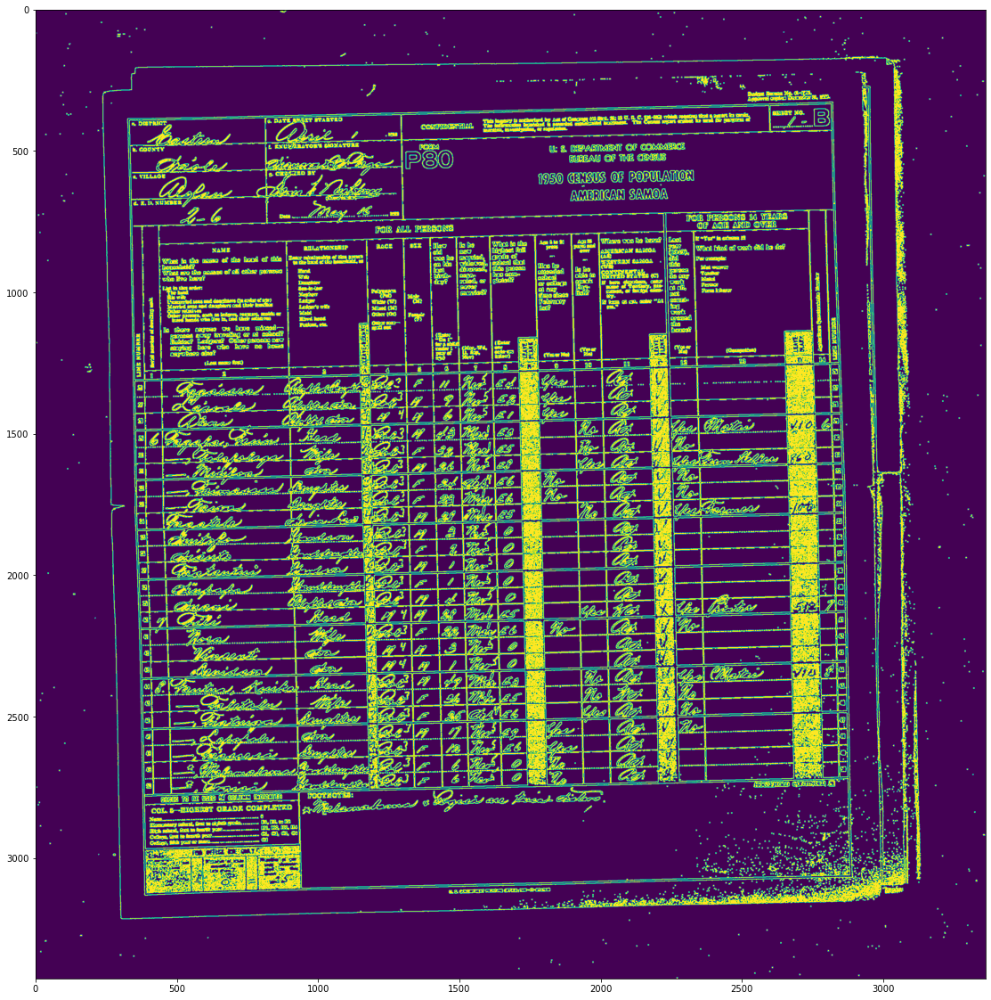

In [8]:
plt.figure(figsize=(20,20))
plt.imshow(edges)

In [9]:
cnt = sorted(cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2], key = cv2.contourArea)[-1]
mask = np.zeros(gray.shape[0:2],np.uint8)
masked = cv2.drawContours(mask, [cnt],-1,255,-1)

In [10]:
dst = cv2.bitwise_and(img,img, mask=masked)
segmented = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

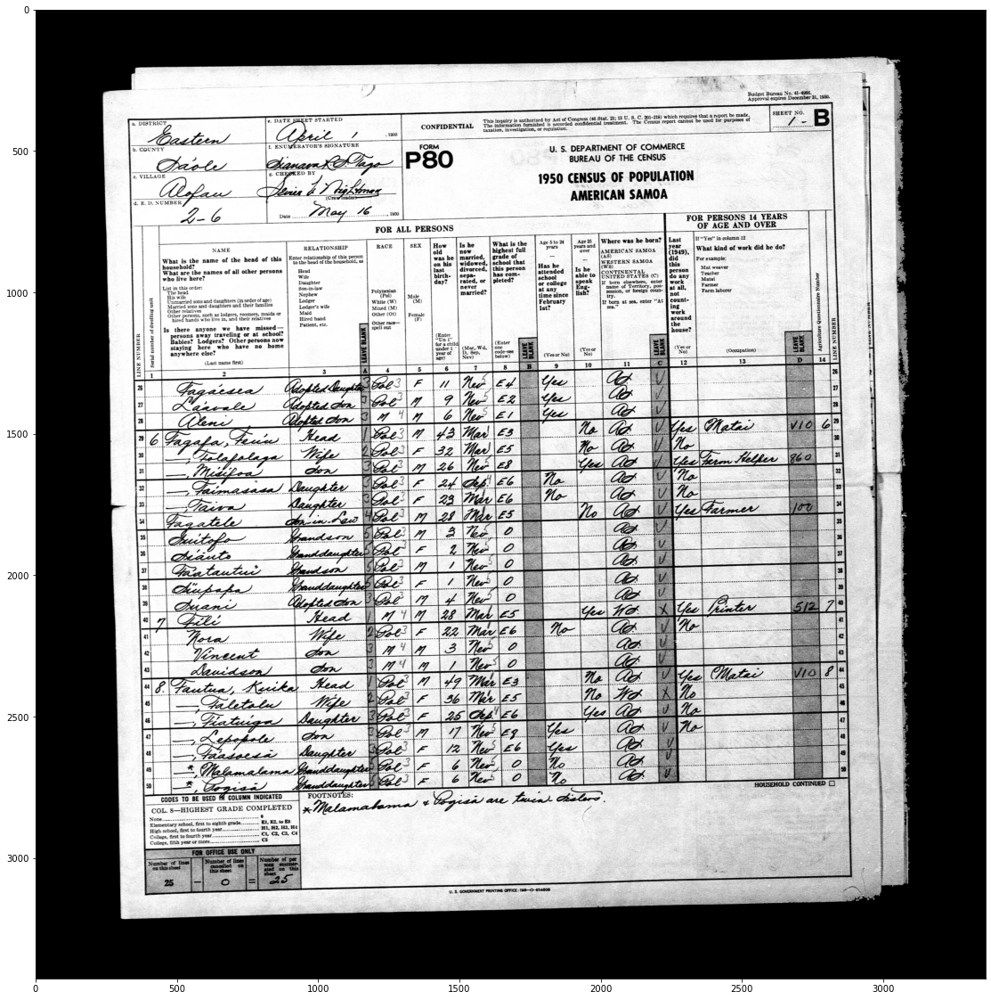

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(segmented)

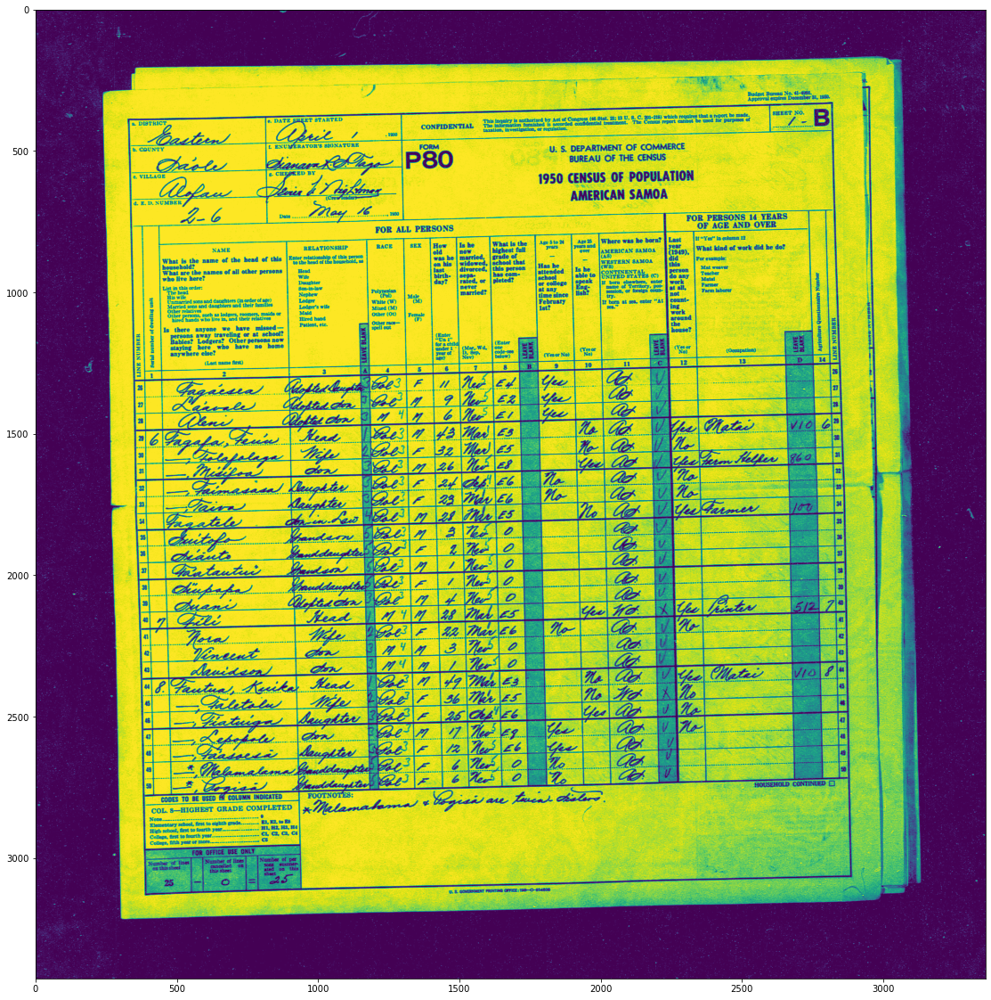

In [12]:
plt.figure(figsize=(20,20))
plt.imshow(gray)

No good!

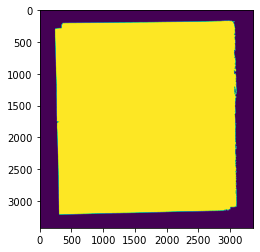

In [13]:
plt.imshow(masked)

In [14]:
masked.shape

(3426, 3362)

In [15]:
3426*3362

11518212

In [16]:
masked.sum()/255

8375547.0

In [17]:
segmented[masked==0] = [255,255,255]

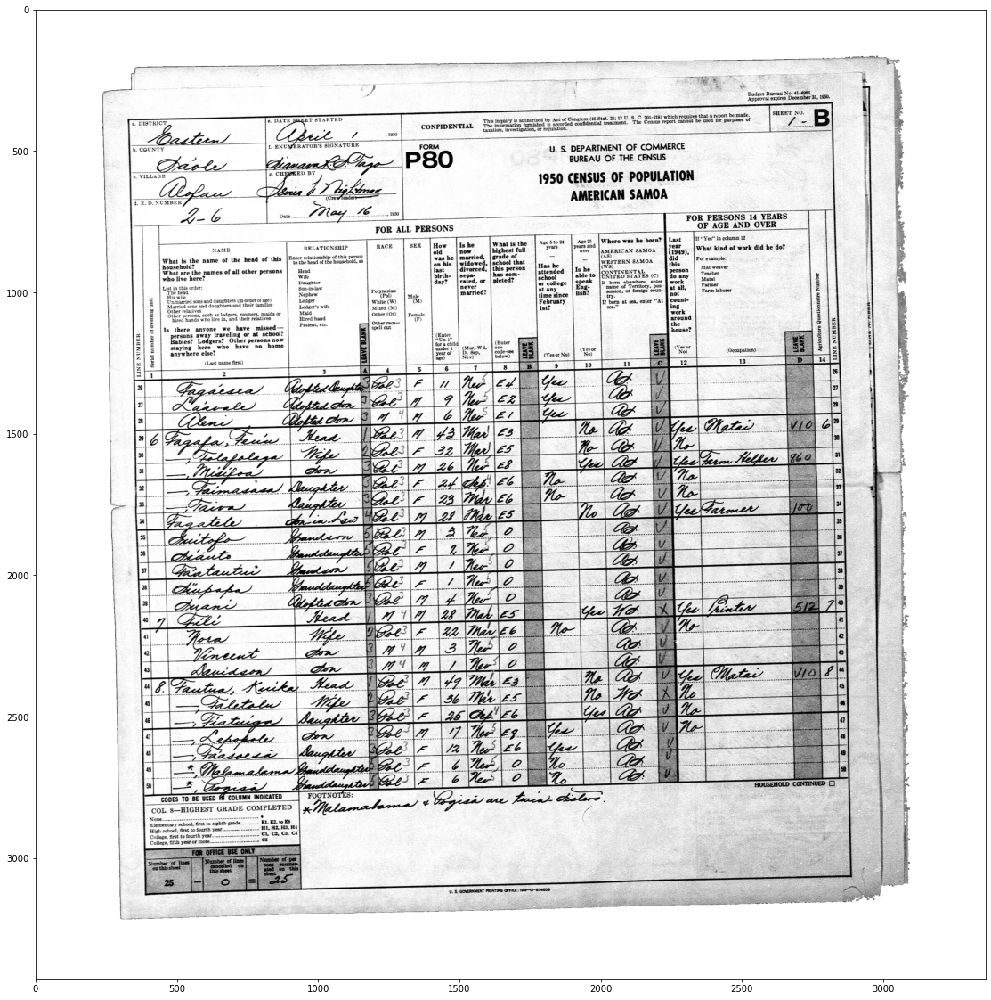

In [18]:
plt.figure(figsize=(20,20))
plt.imshow(segmented);

It's a bit bright, but perhaps by changing the background to white, we'll get a better mean to work with when running the code?

In [19]:
np.mean(segmented),np.mean(gray)

(219.95887373838926, 151.88163206233745)

In [20]:
_,thresh2 = cv2.threshold(segmented, np.mean(segmented), 255, cv2.THRESH_BINARY_INV)
edges2 = cv2.dilate(cv2.Canny(thresh2,0,255), None)

In [21]:
cnt2 = sorted(cv2.findContours(edges2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2], key = cv2.contourArea)[-1]
mask2 = np.zeros(segmented.shape[0:2],np.uint8)
masked2 = cv2.drawContours(mask2, [cnt],-1,255,-1)

In [22]:
dst2 = cv2.bitwise_and(img,img, mask=masked2)
segmented2 = cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB)

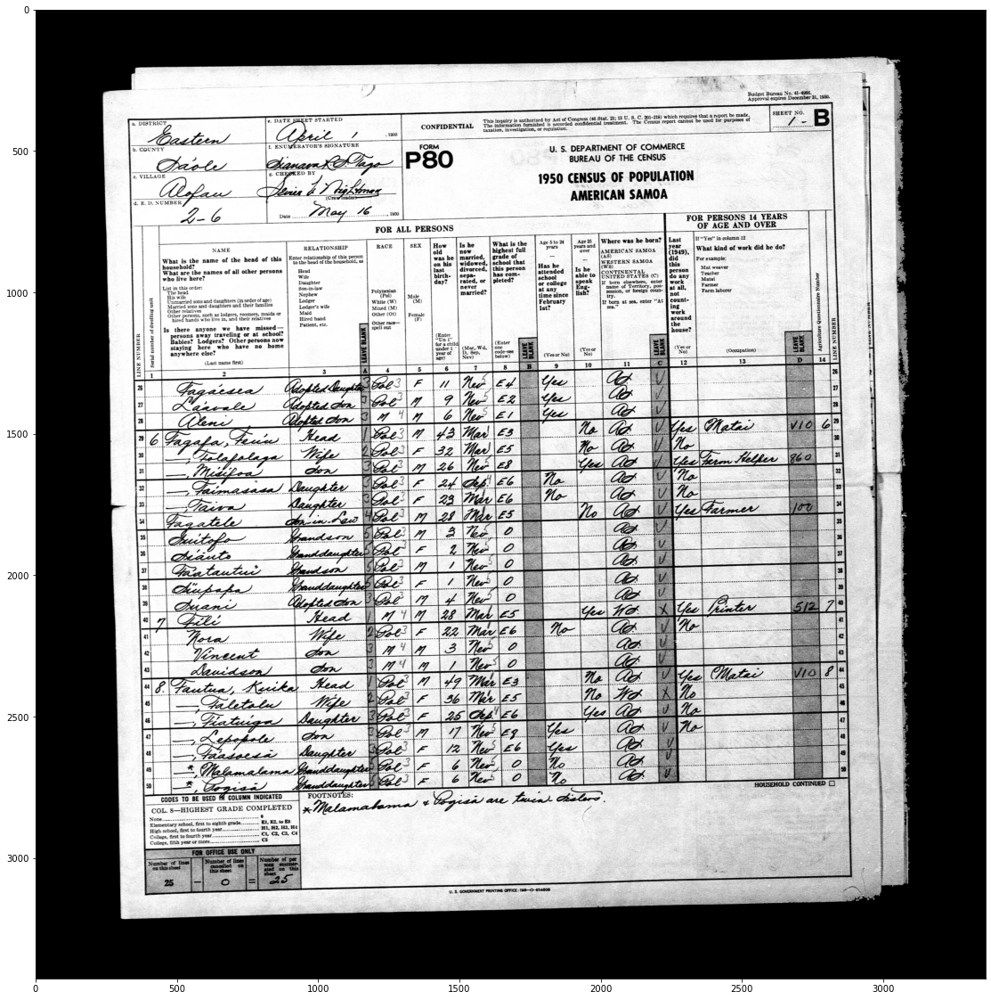

In [23]:
plt.figure(figsize=(20,20))
plt.imshow(segmented2);

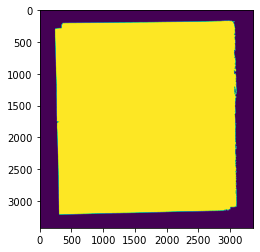

In [24]:
plt.imshow(masked2)

In [25]:
masked.sum()/255,masked2.sum()/255

(8375547.0, 8375547.0)

No good, again


In [26]:
leftmost = cnt[cnt[:,:,0].argmin()][0]
rightmost = cnt[cnt[:,:,0].argmax()][0]
topmost = cnt[cnt[:,:,1].argmin()][0]
bottommost = cnt[cnt[:,:,1].argmax()][0]
leftmost,rightmost,topmost,bottommost

(array([235, 419], dtype=int32),
 array([3093, 3018], dtype=int32),
 array([2961,  166], dtype=int32),
 array([ 305, 3215], dtype=int32))

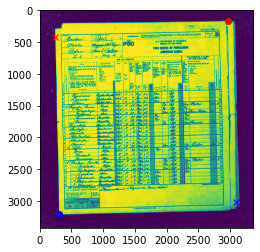

In [27]:
plt.plot(leftmost[0],leftmost[1],marker='x',color='red')
plt.plot(rightmost[0],rightmost[1],marker='x',color='blue')
plt.plot(topmost[0],topmost[1],marker='o',color='red')
plt.plot(bottommost[0],bottommost[1],marker='o',color='blue')
plt.imshow(gray)

In [28]:
lb = (bottommost[0]-leftmost[0])/(bottommost[1]-leftmost[1])
rb = (rightmost[1]-bottommost[1])/(bottommost[0]-rightmost[0])
tl = (leftmost[1]-topmost[1])/(topmost[0]-leftmost[0])
tr = (rightmost[0]-topmost[0])/(rightmost[1]-topmost[1])
angle = sum([np.arctan(lb)*180/np.pi, np.arctan(rb)*180/np.pi, np.arctan(tl)*180/np.pi, np.arctan(tr)*180/np.pi])/4

In [62]:
ang2 = sum([np.arctan(lb),np.arctan(tr)])*90/np.pi

In [29]:
(h,w) = img.shape[:2]

In [30]:
center = (w/2,h/2)

In [35]:
M = cv2.getRotationMatrix2D(center, -1*angle, 1)

In [36]:
rotated = cv2.warpAffine(img, M, (w, h))

In [37]:
rotated.shape

(3426, 3362, 3)

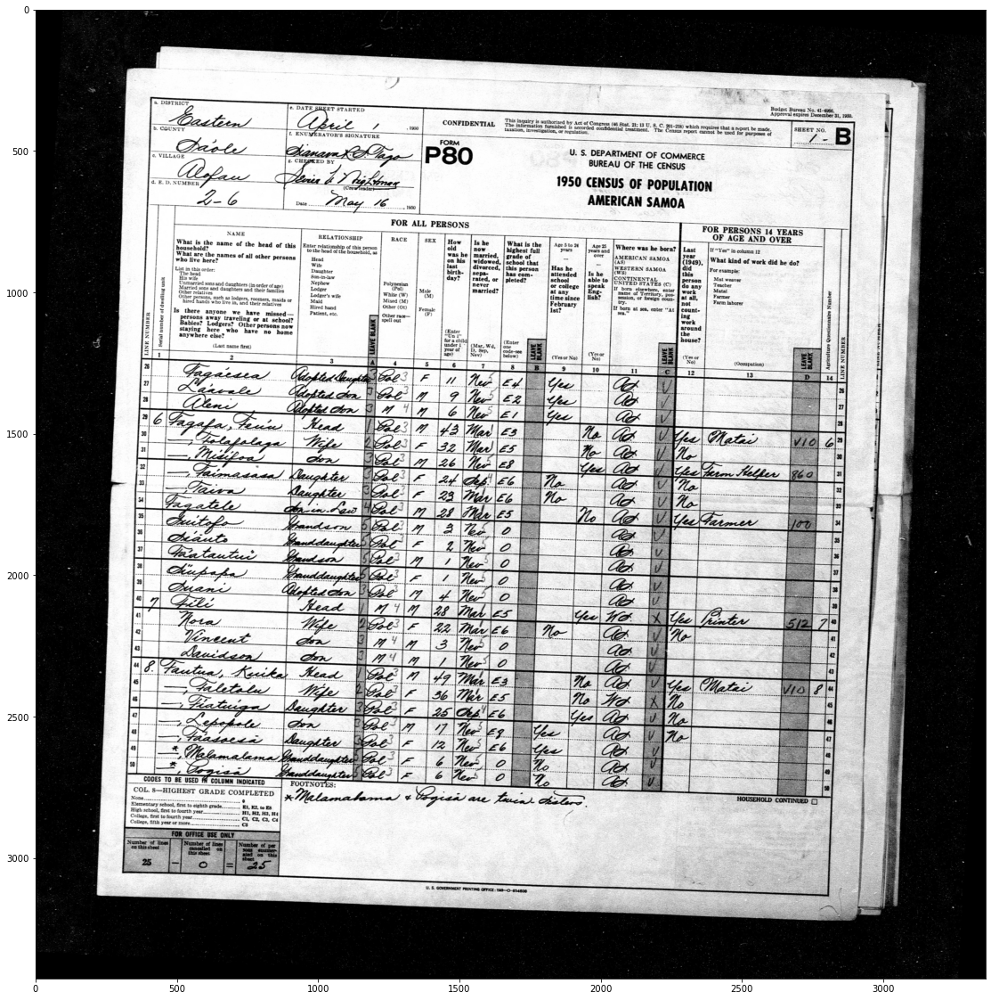

In [39]:
plt.figure(figsize=(20,20))
plt.imshow(rotated)

This seems neutral, might be better if we use the header idea- we can maybe use that idea

In [24]:
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 15, 30, 30, 0)

In [25]:
line_image = np.copy(img)*0

In [26]:
for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

In [27]:
lines_edges = cv2.addWeighted(img,0.8, line_image, 1, 0)

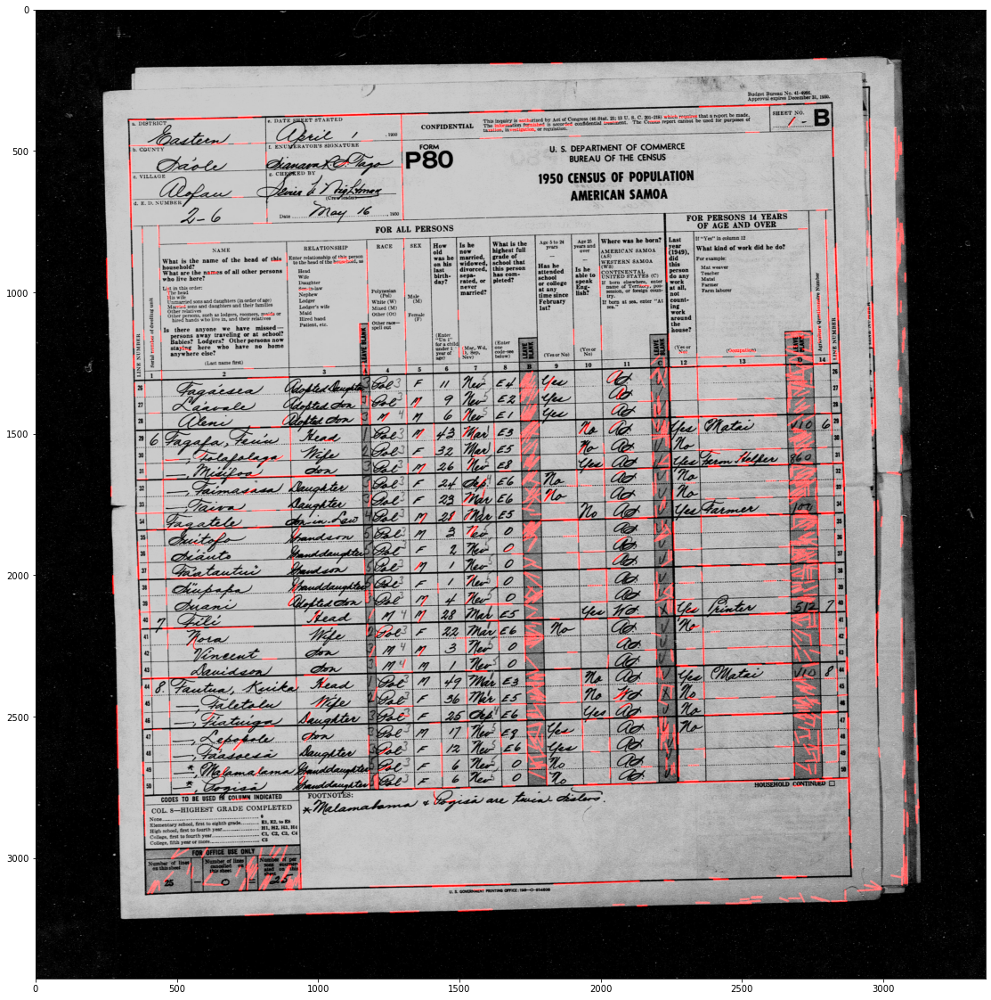

In [28]:
plt.figure(figsize=(20,20))
plt.imshow(lines_edges)

In [31]:
dist = [np.sqrt((x2-x1)**2+(y2-y1)**2) for x1,y1,x2,y2 in lines.reshape(1364,4)]

In [33]:
sum(dist)/len(dist)

52.33300023342218

There's no line length that preserves all the 'real' lines and removes all the useless lines. As such, fwe should use a different tactic

In [40]:
head_path = './data/43290879-American_Samoa/samoa-header.jpg'

In [41]:
head_img=cv2.imread(head_path)

In [44]:
head_img.shape[::-1][1:3]

(2525, 461)

In [48]:
img2 = img.copy()

In [50]:
min_val,max_val,min_loc,max_loc

(-1571483904.0, 14589032448.0, (116, 152), (329, 769))

In [52]:
res.shape

(2966, 838)

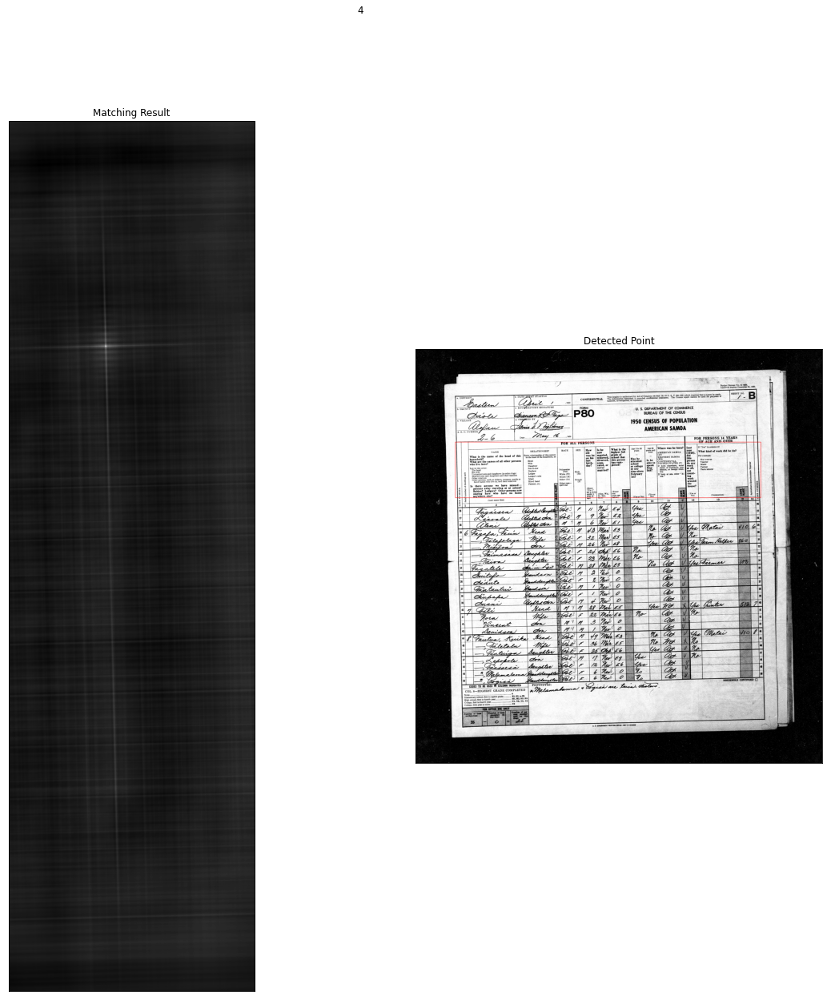

In [49]:
w,h = head_img.shape[::-1][1:3]
res = cv2.matchTemplate(img2,head_img,cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
top_left = max_loc
bottom_right = (top_left[0]+w,top_left[1]+h)
cv2.rectangle(img2,top_left,bottom_right,255,2)
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(res,cmap='gray')
plt.title('Matching Result'), plt.xticks([]),plt.yticks([])
plt.subplot(122), plt.imshow(img2,cmap='gray')
plt.title('Detected Point'), plt.xticks([]),plt.yticks([])
plt.suptitle(cv2.TM_CCOEFF)
plt.show()

In [206]:
top_left

(329, 769)

In [207]:
bottom_right

(3294, 790)

In [203]:
head_img.shape

(461, 2525, 3)

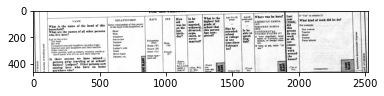

In [204]:
plt.imshow(head_img)

In [53]:
crop = img[leftmost[0]:rightmost[0],topmost[1]:bottommost[1]]

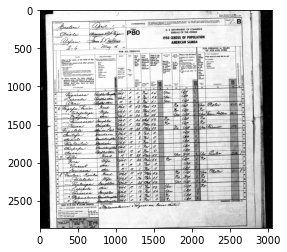

In [54]:
plt.imshow(crop)

In [55]:
(h2,w2) = crop.shape[:2]

In [56]:
center2 = (w2/2,h2/2)

In [64]:
M2 = cv2.getRotationMatrix2D(center2, -1*ang2, 1)

In [65]:
rotated2 = cv2.warpAffine(crop, M2, (w2, h2))

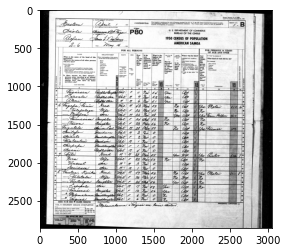

In [66]:
plt.imshow(rotated2)

If we had to, we might suggest just using the average of the topright and bottom left for left shifted or topleft and bottomright for right shifted to better get the angle

In [67]:
rotcopy = rotated2.copy()

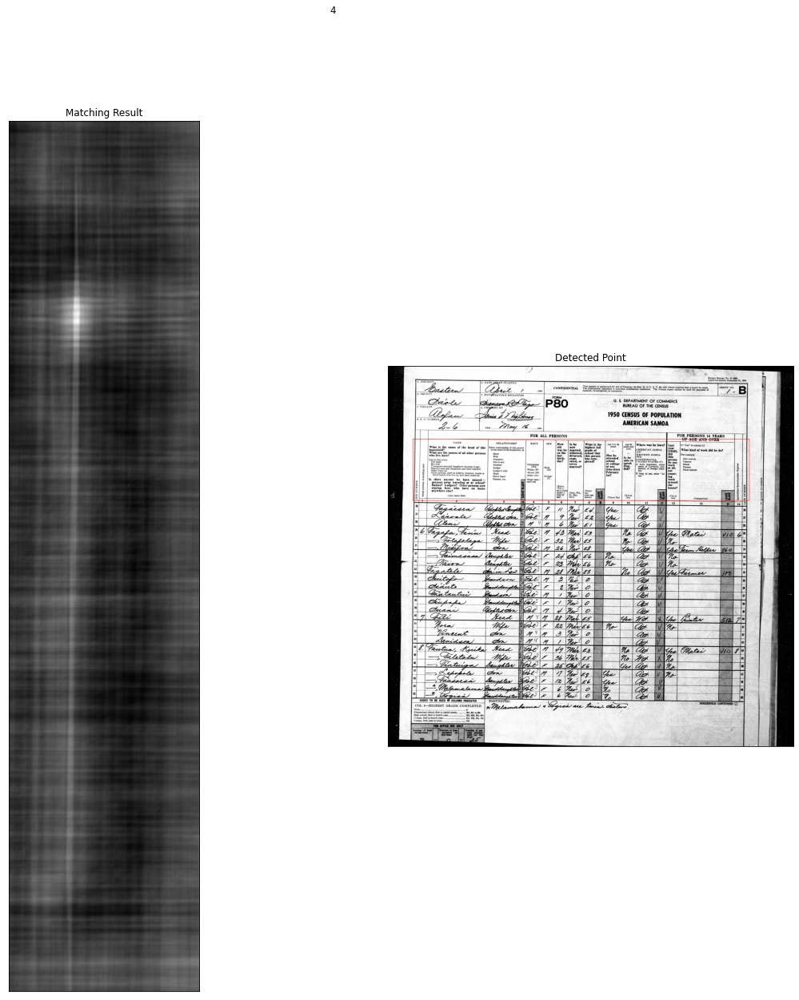

In [68]:
w,h = head_img.shape[::-1][1:3]
res = cv2.matchTemplate(rotcopy,head_img,cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
top_left = max_loc
bottom_right = (top_left[0]+w,top_left[1]+h)
cv2.rectangle(rotcopy,top_left,bottom_right,255,2)
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(res,cmap='gray')
plt.title('Matching Result'), plt.xticks([]),plt.yticks([])
plt.subplot(122), plt.imshow(rotcopy,cmap='gray')
plt.title('Detected Point'), plt.xticks([]),plt.yticks([])
plt.suptitle(cv2.TM_CCOEFF)
plt.show()

In [92]:
rotcopy.shape,top_left,bottom_right

((2858, 3049, 3), (187, 554), (2712, 1015))

In [94]:
rotcopy[top_left[0]:bottom_right[0],bottom_right[1]:,:].shape

(2525, 2034, 3)

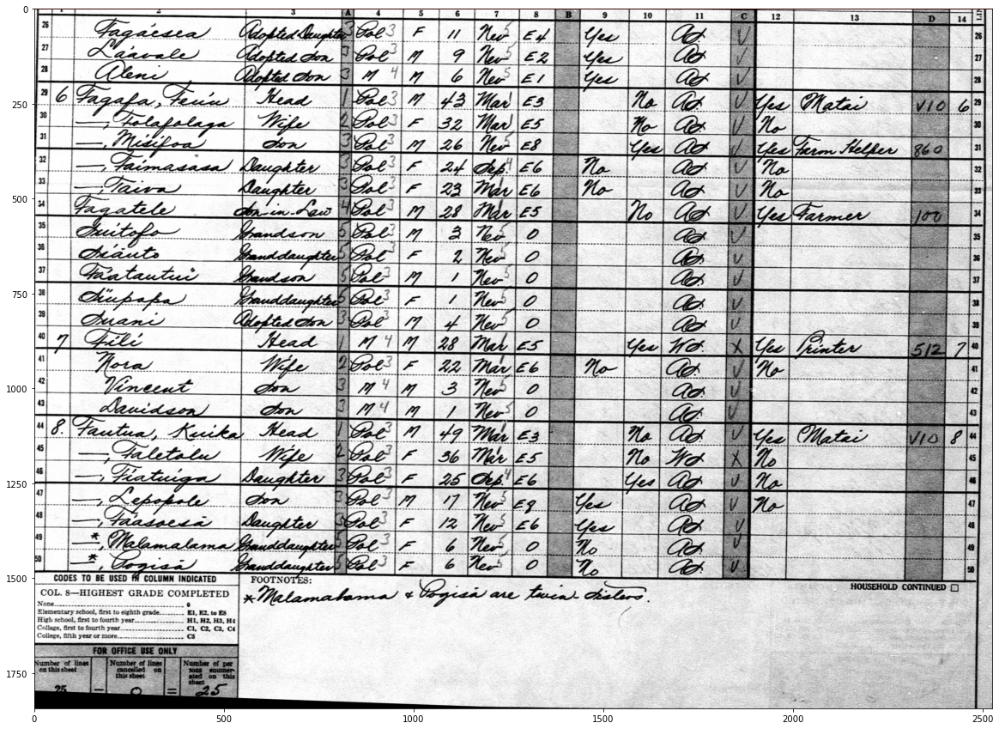

In [96]:
plt.figure(figsize=(20,20))
plt.imshow(rotcopy[bottom_right[1]:,top_left[0]:bottom_right[0],:])

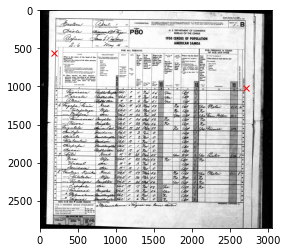

In [82]:
plt.plot(top_left[0],top_left[1],marker='x',color='red')
plt.plot(bottom_right[0],bottom_right[1],marker='x',color='red')
plt.imshow(rotated2)

At this point, we have a potentially iterable function to loop through- there are some questions though- will the angle formula work at large? will the header correctly work for all pages? Will the corrcoeff formula used for the header comparison, in particular, work well here and all the following ones?

Some sources:

https://opencvpython.blogspot.com/2012/06/contours-3-extraction.html
https://stackoverflow.com/questions/11541154/checking-images-for-similarity-with-opencv
https://stackoverflow.com/questions/53854066/pythonhow-to-rotate-an-image-so-that-a-feature-becomes-vertical
https://docs.scipy.org/doc/scipy-0.16.1/reference/generated/scipy.ndimage.interpolation.rotate.html
https://docs.opencv.org/4.x/d4/dc6/tutorial_py_template_matching.html
https://machinelearningknowledge.ai/image-segmentation-in-python-opencv/
https://stackoverflow.com/questions/45322630/how-to-detect-lines-in-opencv